In [1]:
%load_ext autoreload
%autoreload complete

In [ ]:
from pathlib import Path
import pickle

import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cfr import ProxyDatabase
import cfr
import regionmask
from shapely.geometry import box

from lmrecon.plotting import plot_field, subplots_cartopy, use_zero_xlim
from lmrecon.util import get_base_path, get_closest_gridpoint, get_closest_gridpoint_with_data, get_data_path, remove_empty_proxies
from lmrecon.stats import area_weighted_mean, average_annually, average_seasonally, annualize_seasonal_data, rmse, area_weighted_rmse
from lmrecon.psm import LinearPSM, ReducedSpacePSM
from lmrecon.time import map_season_to_decimal, map_decimal_to_season, Season, convert_decimal_year_to_datetime, convert_datetime_to_decimal_year, use_tuple_time_coords, use_decimal_year_time_coords

# Analysis of all calibrated proxies

In [3]:
obs_dataset = "obs/2026-02-23T14-15-53"  # MPI, final reconstruction
pdb: cfr.ProxyDatabase = pickle.load((get_data_path() / f"{obs_dataset}/pdb.pkl").open("rb")).slice((850, 2010))
psms = pickle.load((get_data_path() / f"{obs_dataset}/psms.pkl").open("rb"))

Slicing ProxyRecord: 100%|██████████| 370/370 [00:00<00:00, 465.65it/s] 


In [4]:
len(pdb.records)

370

In [5]:
sum([len(p.time) > 0 for p in pdb.slice((850, 851)).records.values()])

Slicing ProxyRecord: 100%|██████████| 370/370 [00:00<00:00, 445.34it/s] 


44

In [6]:
sum([len(p.time) > 0 for p in pdb.slice((2009, 2010)).records.values()])

Slicing ProxyRecord: 100%|██████████| 370/370 [00:00<00:00, 507.68it/s] 


30

(<Figure size 2400x1800 with 2 Axes>,
 {'map': <GeoAxes: >,
  'count': <Axes: xlabel='Year (AD)', ylabel='number of proxies'>})

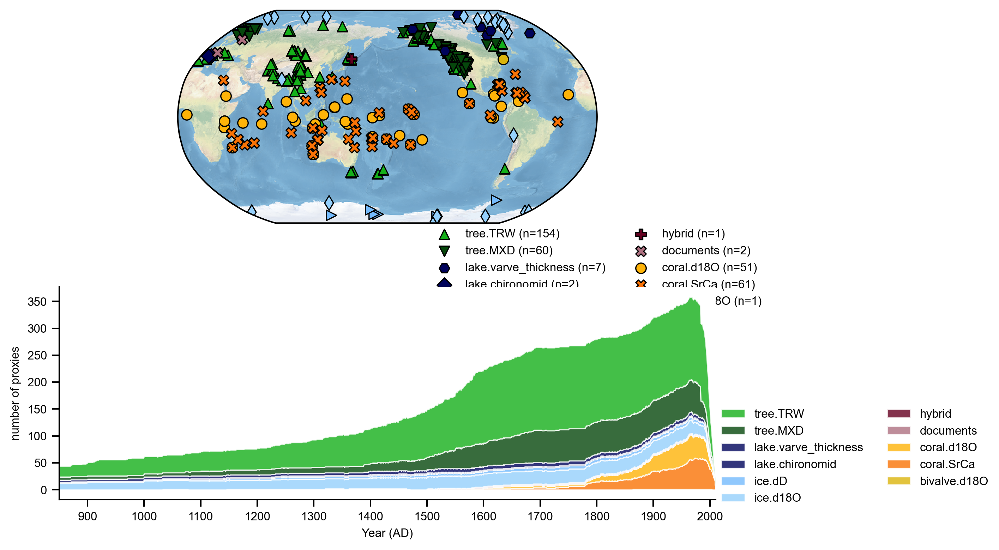

In [7]:
pdb.plot(
    plot_count=True,
    year=np.arange(850, 2010+1),
    plot_xticks=np.arange(900, 2001, 100),
    plot_timespan=(850, 2010),
    figsize=(8, 6),
    lgd_ncol=2
)

<GeoAxes: >

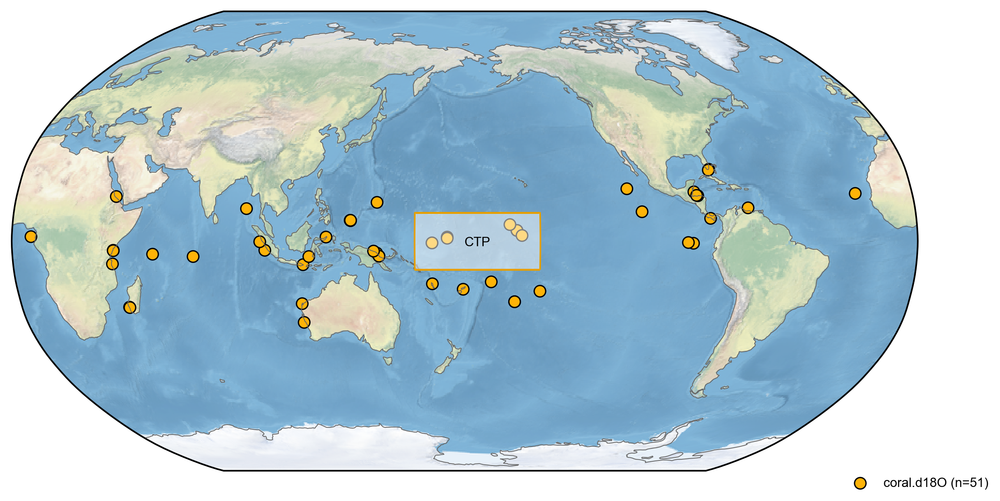

In [8]:
fig, ax = pdb.filter("ptype", "coral.d18O").plot()
regionmask.Regions([box(160, -10, 210, 10)], abbrevs=["CTP"]).plot(ax=ax["map"], label="abbrev", text_kws=dict(backgroundcolor="none", va="center_baseline"), line_kws=dict(ec="C0", fc=(1, 1, 1, 0.5)))

Slicing ProxyRecord: 100%|██████████| 370/370 [00:00<00:00, 448.80it/s] 


(<Figure size 3000x3000 with 1 Axes>, {'map': <GeoAxes: >})

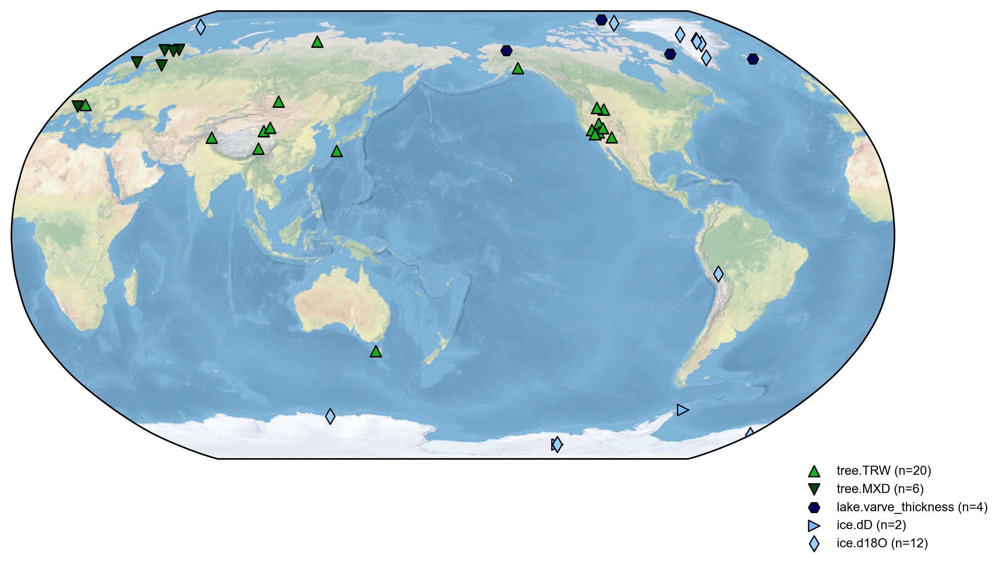

In [9]:
remove_empty_proxies(pdb.slice((850, 851))).plot()

In [10]:
def get_calibration_field(ptype):
    from collections import Counter
    fields = []
    for pid in pdb.filter("ptype", ptype).records.keys():
        psm_or_dict = psms[pid]
        if isinstance(psm_or_dict, dict):
            fields.append(list(psm_or_dict.values())[0].field)
        else:
            fields.append(psm_or_dict.field)
    print(ptype, Counter(fields))

get_calibration_field("coral.d18O")
get_calibration_field("coral.SrCa")

coral.d18O Counter({'tos': 51})
coral.SrCa Counter({'tos': 61})


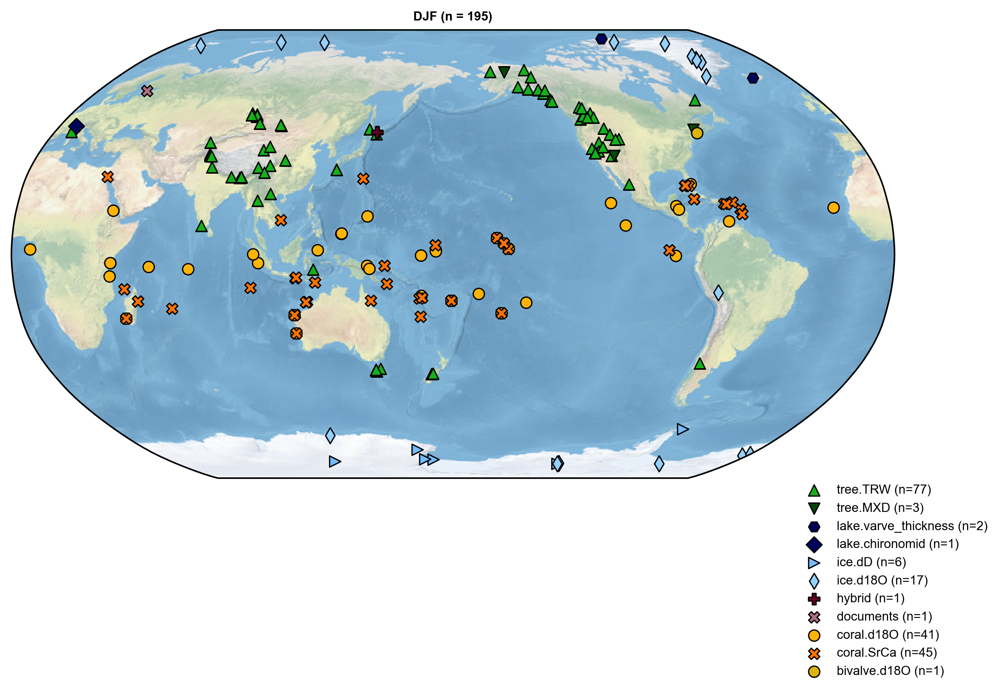

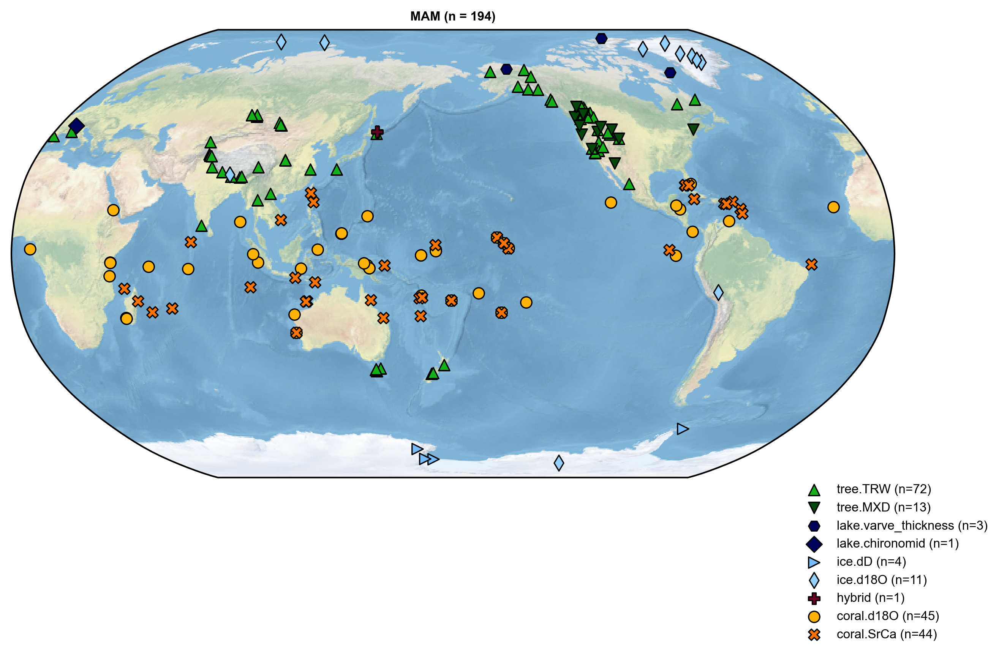

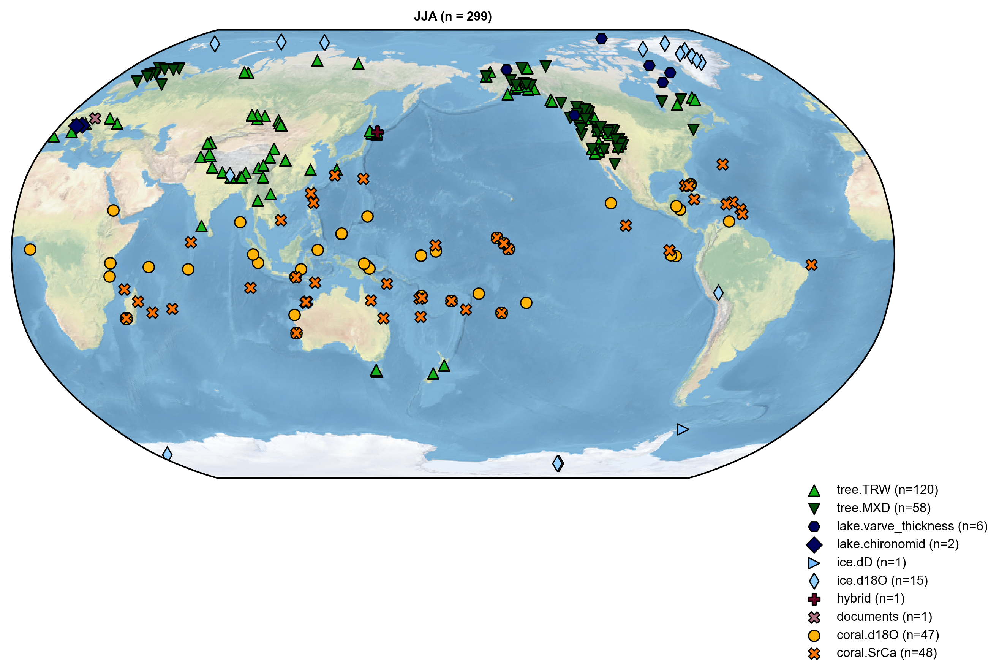

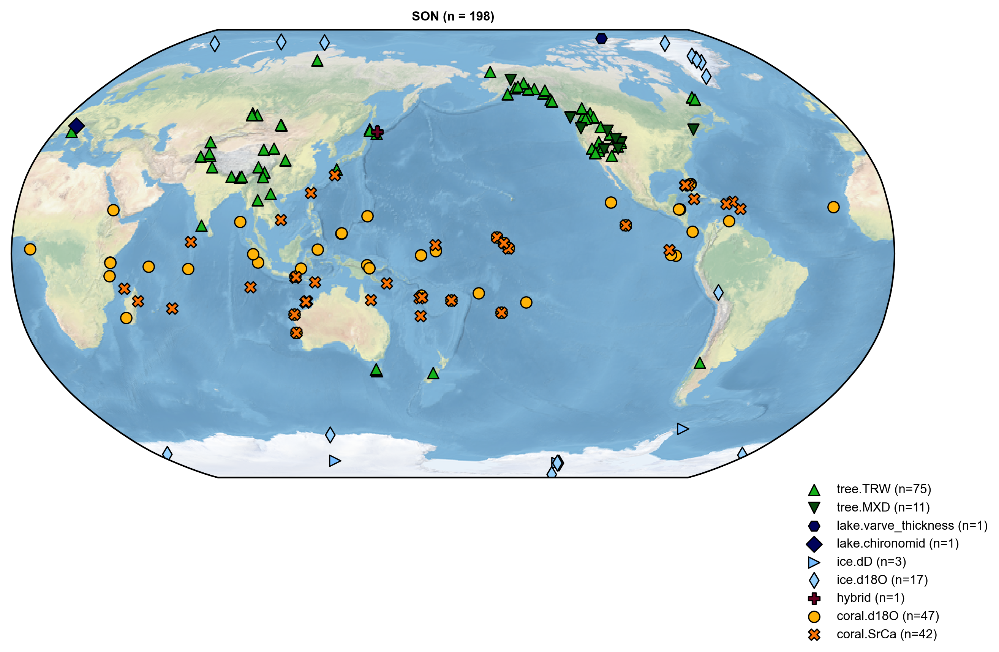

In [11]:
def plot_proxies_by_season(slice=None):
    proxies_by_season = {season: [] for season in [Season.DJF, Season.MAM, Season.JJA, Season.SON]}
    for pid, psm in psms.items():
        pobj = pdb[pid]
        if isinstance(psm, dict):
            for season in psm.keys():
                proxies_by_season[season].append(pobj)
        else:
            for season in psm.seasonality:
                proxies_by_season[season].append(pobj)
    
    for season, pobjs in proxies_by_season.items():
        pdbs = cfr.ProxyDatabase({pobj.pid: pobj for pobj in pobjs})
        if slice:
            pdbs = pdbs.slice((850, 1200))
            pdbs = cfr.ProxyDatabase(
                {pid: pobj for pid, pobj in pdbs.records.items() if len(pobj.time) > 0}
            )
        fig, ax = pdbs.plot()
        ax["map"].set_title(f"{season.name} (n = {len(pdbs.records)})")

plot_proxies_by_season()
# plot_proxies_by_season((850, 1050))

0.37718858360541396


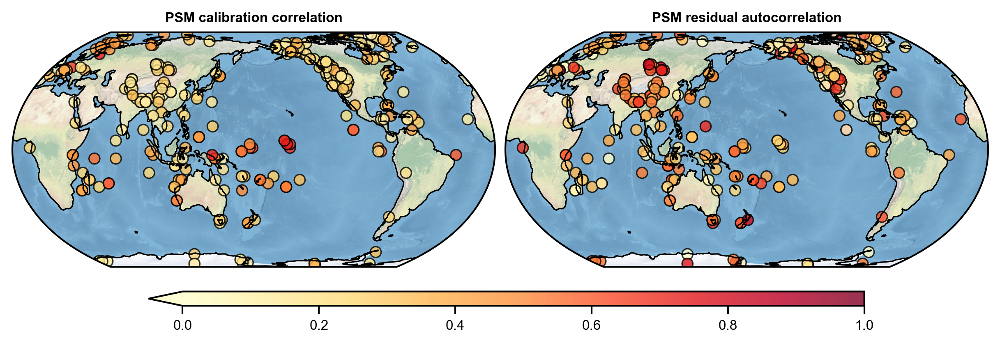

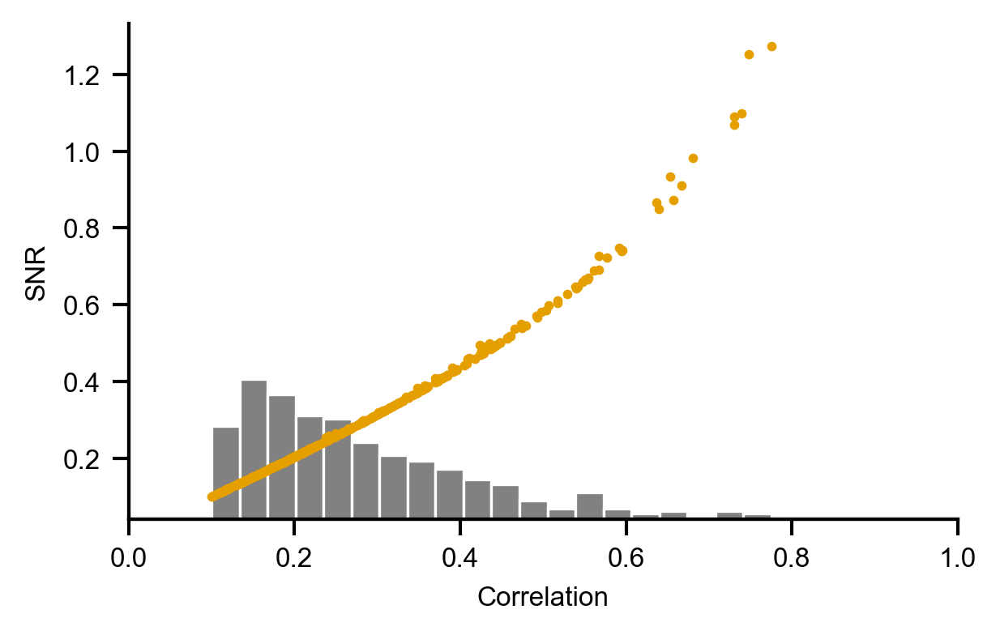

In [12]:
def plot_calibration_stats():
    lats = []
    lons = []
    corrs = []
    acorrs = []
    snrs = []
    for pid, psm in psms.items():
        if isinstance(psm, dict):
            psm1 = list(psm.values())[0]
            lat = psm1.lat
            lon = psm1.lon
            corr = np.mean([np.abs(psm_.corr) for psm_ in psm.values()])
            acorr = np.mean([psm_.annual_error_acor for psm_ in psm.values()])
            snr = np.mean([psm_.SNR for psm_ in psm.values()])
        else:
            lat = psm.lat
            lon = psm.lon
            corr = np.abs(psm.corr)
            acorr = psm.annual_error_acor
            snr = psm.SNR
        
        if pid in pdb.records:
            lats.append(lat)
            lons.append(lon)
            corrs.append(corr)
            acorrs.append(acorr)
            snrs.append(snr)

    print(np.median(acorrs))
    fig, axs = subplots_cartopy(1, 2, figsize=(8, 4.5), central_longitude=175)
    axs[0].scatter(lons, lats, c=corrs,
                   cmap="YlOrRd", s=40, edgecolors="black", alpha=0.8,
                   transform=ccrs.PlateCarree(), vmin=0, vmax=1)
    axs[0].set_title("PSM calibration correlation")
    axs[1].scatter(lons, lats, c=acorrs,
                   cmap="YlOrRd", s=40, edgecolors="black", alpha=0.8,
                   transform=ccrs.PlateCarree(), vmin=0, vmax=1)
    axs[1].set_title("PSM residual autocorrelation")
    fig.colorbar(axs[0].collections[0], ax=axs, orientation='horizontal',
                 fraction=0.03, pad=0.05, aspect=50, extend="min")

    for ax in axs:
        ax.set_global()
        ax.stock_img()
        ax.coastlines()
    

    fig, ax = plt.subplots(figsize=(4, 2.5))
    ax.patch.set_visible(False)
    ax_hist = ax.twinx()
    ax.set_zorder(ax_hist.get_zorder()+1)
    ax_hist.hist(corrs, bins=20, alpha=0.99, color='gray', density=True)
    ax_hist.set_ylim(0, 15)
    ax_hist.set_yticks([])
    ax.scatter(corrs, snrs)
    ax.set_xlabel("Correlation")
    ax.set_ylabel("SNR")
    ax.set_xlim(0, 1)

plot_calibration_stats()

Text(0.5, 1.0, 'median = 0.25   n = 370')

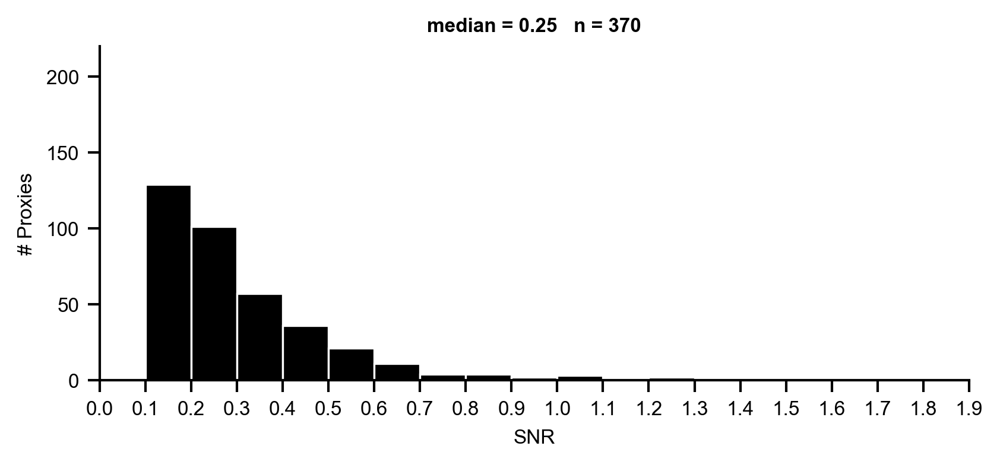

In [13]:
snr = []
for psm_or_dict in psms.values():
    if isinstance(psm_or_dict, dict):
        snr.append(np.median([psm.SNR for psm in psm_or_dict.values()]))
    else:
        snr.append(psm_or_dict.SNR)

fig, ax = plt.subplots()
bins = np.linspace(0, 1.9, 20)
ax.hist(snr, bins=bins, fc="black")
ax.set_xlabel("SNR")
ax.set_ylabel("# Proxies")
ax.set_xlim(0, 1.9)
ax.set_ylim(0, 220)
ax.set_xticks(bins)
ax.set_title(f"median = {np.median(snr):.2f}   n = {len(psms)}")

bivalve.d18O 0.3160355926087226
coral.SrCa 1.2513702306125694
coral.d18O 1.273493995303994
documents 1.0979848127119691
hybrid 0.40843023522644417
ice.d18O 0.4747160142188052
ice.dD 0.3410785409265793
lake.chironomid 0.48701839902321997
lake.varve_thickness 0.4088196131235733
tree.MXD 0.5460992851481655
tree.TRW 0.6039226294675247


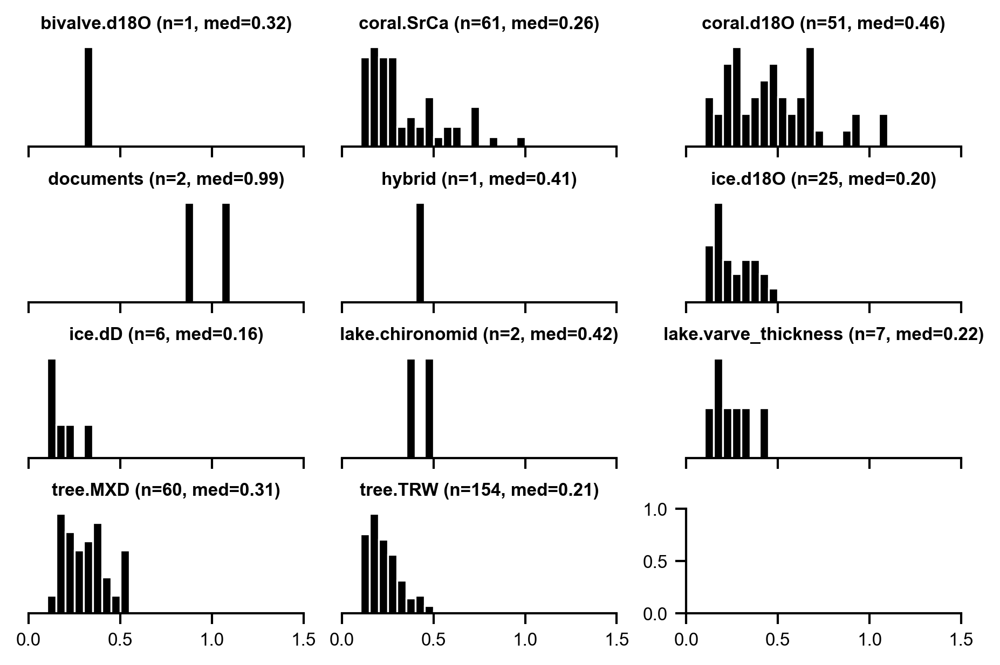

In [14]:
from seaborn import despine


def plot_snr_by_ptype():
    snrs = {ptype: [] for ptype in sorted(list(set([p.ptype for p in pdb.records.values()])))}
    all_snrs = []
    for pid, psm in psms.items():
        if isinstance(psm, dict):
            snr = np.mean([psm_.SNR for psm_ in psm.values()])
        else:
            snr = psm.SNR
        
        if pid in pdb.records:
            snrs[pdb[pid].ptype].append(snr)
            all_snrs.append(snr)

    if "ice.melt" in snrs:
        del snrs["ice.melt"]

    rows = int(np.ceil(len(snrs) / 3))
    bins = np.arange(0, max(all_snrs), 0.05)
    fig, axs = plt.subplots(rows, 3, figsize=(3 * 2, rows * 1), sharex=True, sharey=False)
    for i, (ptype, snr) in enumerate(snrs.items()):
        print(ptype, max(snr))
        ax = axs.flat[i]
        ax.set_title(f"{ptype} (n={len(snr)}, med={np.median(snr):.2f})")
        ax.hist(snr, bins=bins, fc="black", density=True)
        ax.set_yticks([], [])
        ax.set_xlim(0, 1.5)
        despine(ax=ax, left=True)
    
        use_zero_xlim(ax)

plot_snr_by_ptype()

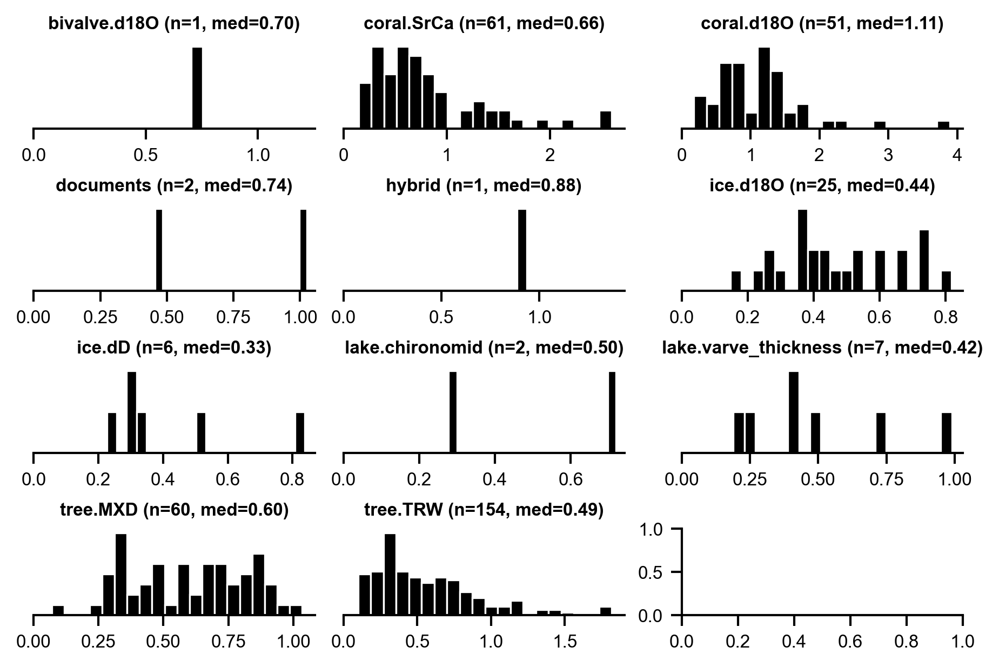

In [15]:
from seaborn import despine


# Absolute slope
def plot_slope_by_ptype():
    slopes = {ptype: [] for ptype in sorted(list(set([p.ptype for p in pdb.records.values()])))}
    for pid, psm in psms.items():
        if isinstance(psm, dict):
            slope = np.mean([np.abs(psm_._model.coef_[0][0]) for psm_ in psm.values()])
        else:
            slope = np.abs(psm._model.coef_[0][0])
        
        if pid in pdb.records:
            slopes[pdb[pid].ptype].append(slope)

    if "ice.melt" in slopes:
        del slopes["ice.melt"]

    rows = int(np.ceil(len(slopes) / 3))
    fig, axs = plt.subplots(rows, 3, figsize=(3 * 2, rows * 1), sharex=False, sharey=False)
    for i, (ptype, slope) in enumerate(slopes.items()):
        ax = axs.flat[i]
        ax.set_title(f"{ptype} (n={len(slope)}, med={np.median(slope):.2f})")
        ax.hist(slope, bins=20, fc="black", density=True)
        ax.set_yticks([], [])
        # ax.set_xlim(0, 1.5)
        despine(ax=ax, left=True)
    
        use_zero_xlim(ax)

plot_slope_by_ptype()

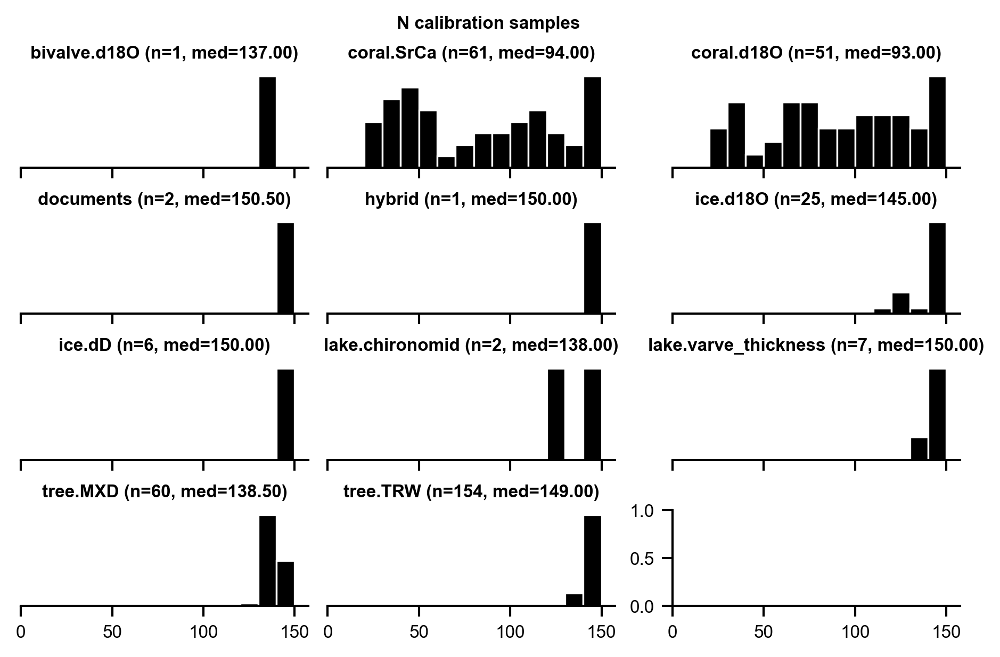

In [16]:
from seaborn import despine


def plot_nsamples_by_ptype():
    snrs = {ptype: [] for ptype in sorted(list(set([p.ptype for p in pdb.records.values()])))}
    for pid, psm in psms.items():
        if isinstance(psm, dict):
            snr = int(np.median([psm_.calibration_n_samples for psm_ in psm.values()]))
        else:
            snr = psm.calibration_n_samples
        
        if pid in pdb.records:
            snrs[pdb[pid].ptype].append(snr)

    if "ice.melt" in snrs:
        del snrs["ice.melt"]

    rows = int(np.ceil(len(snrs) / 3))
    bins = np.arange(0, 160, 10)
    fig, axs = plt.subplots(rows, 3, figsize=(3 * 2, rows * 1), sharex=True, sharey=False)
    for i, (ptype, snr) in enumerate(snrs.items()):
        ax = axs.flat[i]
        ax.set_title(f"{ptype} (n={len(snr)}, med={np.median(snr):.2f})")
        ax.hist(snr, bins=bins, fc="black", density=True)
        ax.set_yticks([], [])
        # ax.set_xlim(0, 1.5)
        despine(ax=ax, left=True)
    
        use_zero_xlim(ax)
    
    fig.suptitle("N calibration samples")

plot_nsamples_by_ptype()